https://stackoverflow.com/questions/38320865/how-to-replace-a-contour-rectangle-in-an-image-with-a-new-image-using-python

In [ ]:
!pip install blend_modes

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import math

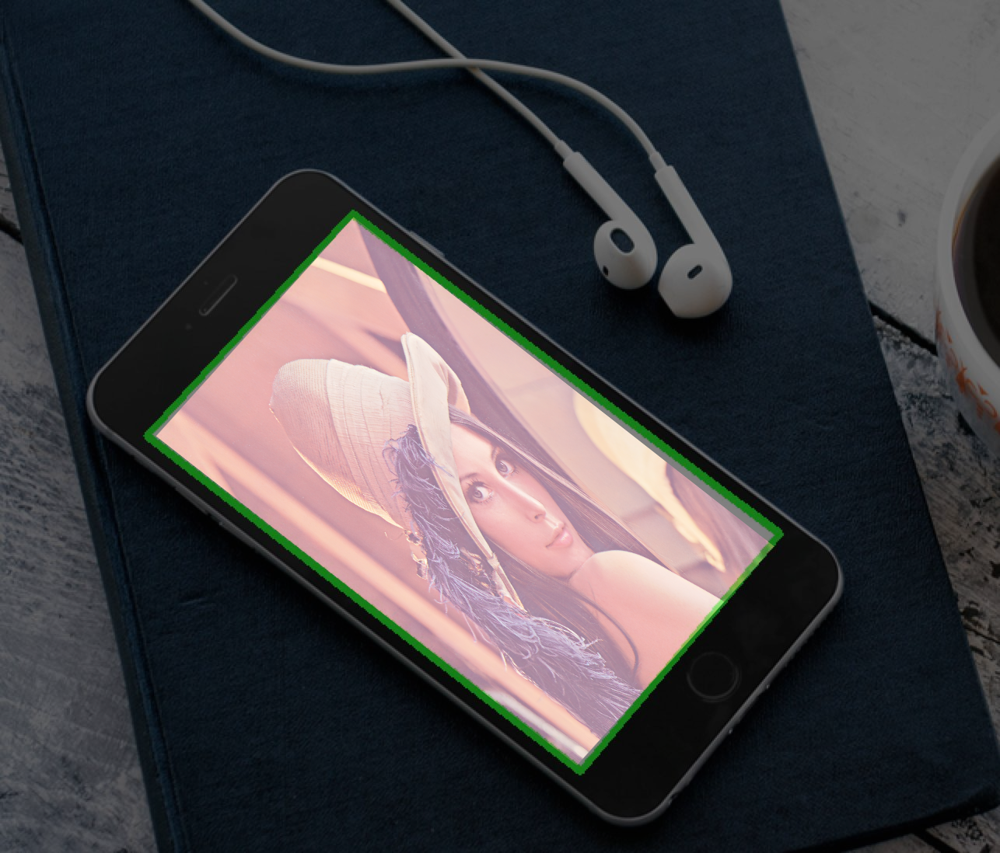

In [ ]:
img1 = cv2.imread("/content/46F1U.jpg")
img2 = cv2.imread("/content/Lenna.png")

img2 = cv2.resize(img2, (0,0), fx=0.25, fy=0.25) 

rows,cols,ch = img1.shape

# Hard coded the 3 corner points of white cavity labelled with green rect.
pts1 = np.float32([[201, 561], [455, 279], [742, 985]])
# Hard coded the same points on the reference image to be fitted.
pts2 = np.float32([[0, 0], [512, 0], [0, 512]])

# Getting affine transformation form sample image to template.
M = cv2.getAffineTransform(pts2,pts1)

# Applying the transformation, mind the (cols,rows) passed, these define the final dimensions of output after Transformation.
dst = cv2.warpAffine(img2,M,(cols,rows))

# Just for Debugging the output.
final = cv2.addWeighted(dst, 0.5, img1, 0.5, 1)
# cv2.imwrite("./garbage.png", final)

cv2_imshow(final)

In [ ]:
import numpy as np
from numpy import cos, sin

def rotated_rectangle(image, start_point, end_point, color, thickness, rotation=0, fill=True):
    center_point = [(start_point[0]+end_point[0])//2, (start_point[1]+end_point[1])//2]
    height = end_point[1] - start_point[1]
    width = end_point[0] - start_point[0]
    angle = np.radians(rotation)
    
    # Determine the coordinates of the 4 corner points
    rotated_rect_points = []
    x = center_point[0] + ((width / 2) * cos(angle)) - ((height / 2) * sin(angle))
    y = center_point[1] + ((width / 2) * sin(angle)) + ((height / 2) * cos(angle))
    rotated_rect_points.append([x,y])
    x = center_point[0] - ((width / 2) * cos(angle)) - ((height / 2) * sin(angle))
    y = center_point[1] - ((width / 2) * sin(angle)) + ((height / 2) * cos(angle))
    rotated_rect_points.append([x,y])
    x = center_point[0] - ((width / 2) * cos(angle)) + ((height / 2) * sin(angle))
    y = center_point[1]- ((width / 2) * sin(angle)) - ((height / 2) * cos(angle))
    rotated_rect_points.append([x,y])
    x = center_point[0] + ((width / 2) * cos(angle)) + ((height / 2) * sin(angle))
    y = center_point[1] + ((width / 2) * sin(angle)) - ((height / 2) * cos(angle))
    rotated_rect_points.append([x,y])
    cv2.polylines(image, np.array([rotated_rect_points], np.int32), True, color, thickness)
    if fill==True:
      cv2.fillPoly(image, np.array([rotated_rect_points], np.int32), color)

# Remove background

https://stackoverflow.com/questions/64491530/how-to-remove-the-background-from-a-picture-in-opencv-python

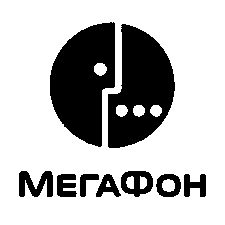

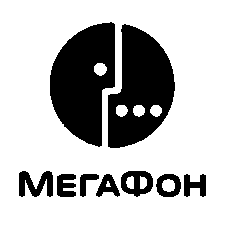

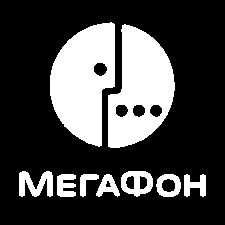

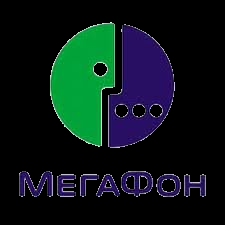

In [ ]:
import cv2
import numpy as np

# Read image
img = cv2.imread('/content/MegaFon_logo_2.jpg')

hh, ww = img.shape[:2]

# threshold on white
# Define lower and uppper limits
lower = np.array([200, 200, 200])
upper = np.array([255, 255, 255])

# Create mask to only select black
thresh = cv2.inRange(img, lower, upper)

# apply morphology
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

# invert morp image
mask = 255 - morph

# apply mask to image
result = cv2.bitwise_and(img, img, mask=mask)


# save results
cv2.imwrite('pills_thresh.jpg', thresh)
cv2.imwrite('pills_morph.jpg', morph)
cv2.imwrite('pills_mask.jpg', mask)
cv2.imwrite('pills_result.jpg', result)

cv2_imshow(thresh)
cv2_imshow(morph)
cv2_imshow(mask)
cv2_imshow(result)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Try with tshirt

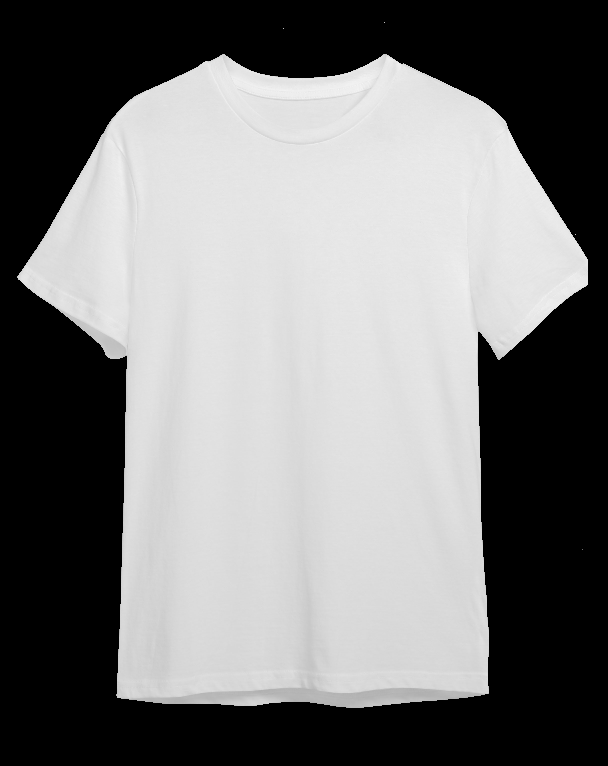

In [ ]:
import numpy as np
import cv2

#Load the Image
imgo = cv2.imread('/content/tshirt.jpg')
imgo = cv2.resize(imgo, (0,0), fx=0.25, fy=0.25) 
height, width = imgo.shape[:2]

#Create a mask holder
mask = np.zeros(imgo.shape[:2],np.uint8)

#Grab Cut the object
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

#Hard Coding the Rect The object must lie within this rect.
rect = (10,10,width-30,height-30)
cv2.grabCut(imgo,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img1 = imgo*mask[:,:,np.newaxis]

#Get the background
background = imgo - img1

#Change all pixels in the background that are not black to white
background[np.where((background > [0,0,0]).all(axis = 2))] = [255,255,255]

#Add the background and the image
final = background + img1

#To be done - Smoothening the edges

cv2_imshow(img)


In [ ]:
mask_ = img1

In [ ]:
mask_ = cv2.imread('/content/mask1.png')

https://stackoverflow.com/questions/69620706/overlay-image-on-another-image-with-opencv-and-numpy

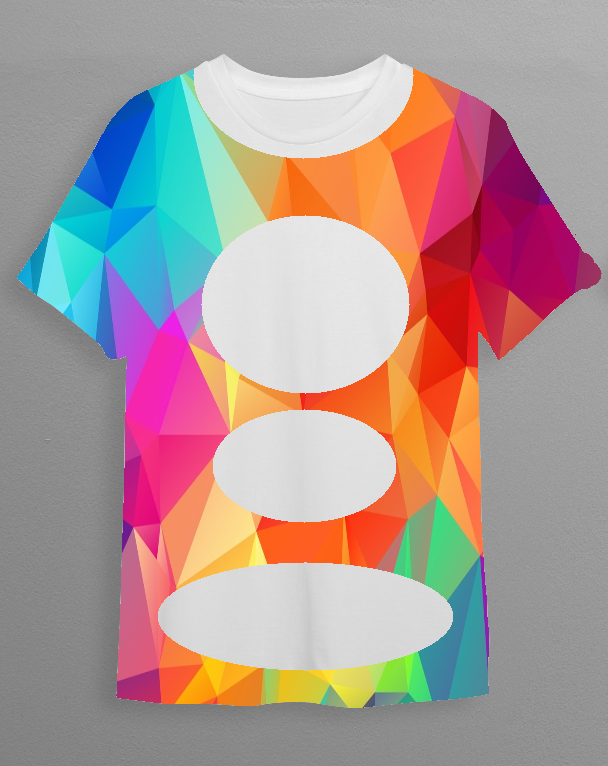

In [ ]:
import cv2
import numpy as np


img = cv2.imread('/content/geometriccolor.jpg')
back = cv2.imread('/content/tshirt.jpg')
back = cv2.resize(back, (0,0), fx=0.25, fy=0.25)


alpha = cv2.resize(mask_, (608, 766))

# extract bgr channels from foreground image
front = img[:,:,0:3]

front = cv2.resize(front, (608,766))

# blend the two images using the alpha channel as controlling mask
result = np.where(alpha==(0,0,0), back, front)

cv2_imshow(result)

In [ ]:
mask_ = cv2.imread('/content/mask2.png')

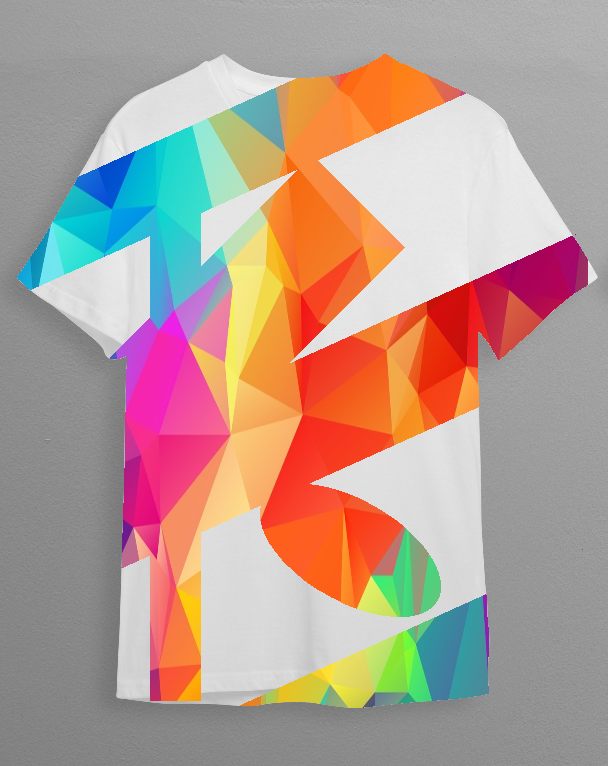

In [ ]:
img = cv2.imread('/content/geometriccolor.jpg')
back = cv2.imread('/content/tshirt.jpg')
back = cv2.resize(back, (0,0), fx=0.25, fy=0.25)

mask_ = cv2.imread('/content/mask2.png')

mask_ = cv2.rectangle(mask_, (150, 150), (200, 700), color=(255, 255, 255), thickness=-1)

rotated_rectangle(mask_, (170, 150), (300, 500), (255,255,255), 1, 45)



center_coordinates = (350, 550)
axesLength = (100, 50)
angle = 30
startAngle = 0
endAngle = 360
color = (255, 255, 255)
thickness = -1
mask_ = cv2.ellipse(mask_, center_coordinates, axesLength, angle,
                          startAngle, endAngle, color, thickness)

old_mask = cv2.imread('/content/download.png')
old_mask = 255 - old_mask

mask_ = cv2.subtract(mask_, old_mask)

alpha = cv2.resize(mask_, (608, 766))

# extract bgr channels from foreground image
front = img[:,:,0:3]

front = cv2.resize(front, (608,766))

# blend the two images using the alpha channel as controlling mask
result = np.where(alpha==(0,0,0), back, front)


cv2_imshow(result)

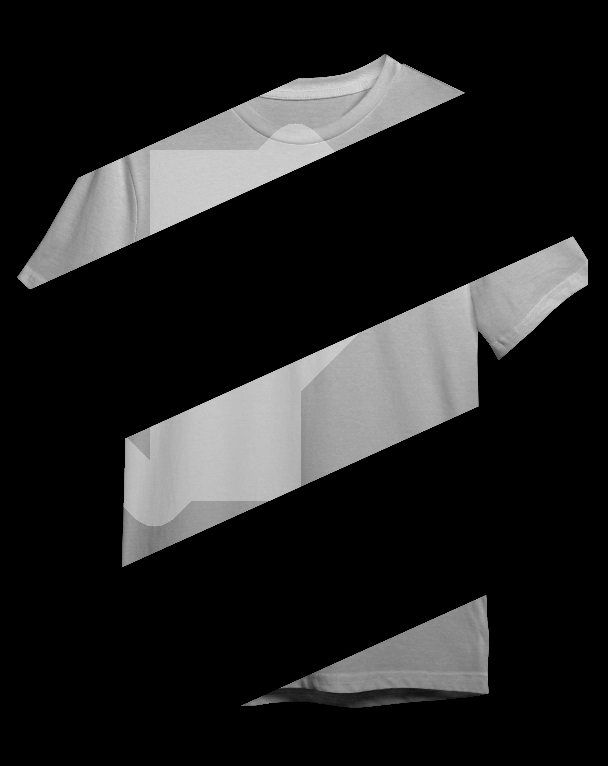

In [ ]:
old_mask = cv2.imread('/content/mask2.png')
new_mask = mask_.copy()

old_mask = 255 - old_mask

mask_out=cv2.subtract(new_mask,old_mask)
# # mask_out=cv2.subtract(new_mask,mask_out)

cv2_imshow(mask_out)

without alpha channel

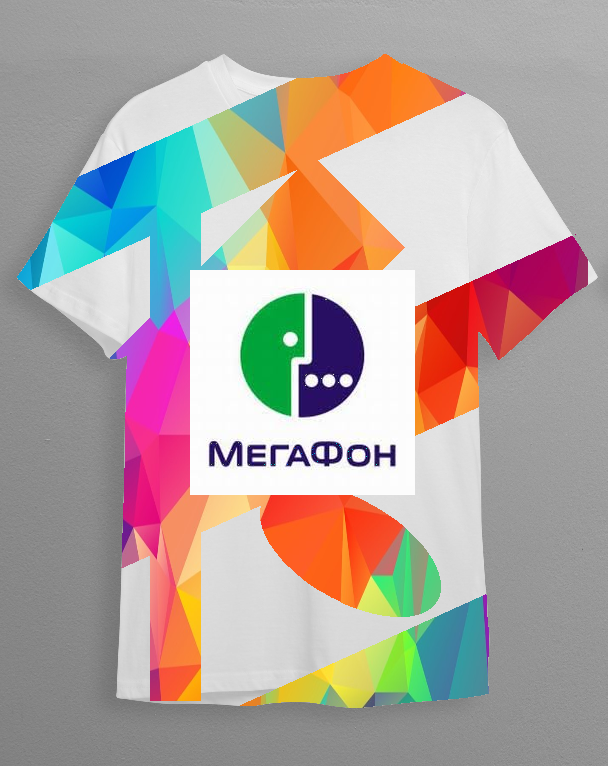

In [ ]:
img2 = cv2.imread('/content/MegaFon_logo_2.jpg') # (225, 225, 3)
img_tshirt = result.copy() # (766, 608, 3)

rows,cols,channels = img2.shape

roi = result[0:rows, 0:cols]

# Now create a mask of logo and create its inverse mask also
img2gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
ret, mask = cv2.threshold(img2gray, 10, 255, cv2.THRESH_BINARY)
mask_inv = cv2.bitwise_not(mask)

# Now black-out the area of logo in ROI
img1_bg = cv2.bitwise_and(roi, roi, mask=mask_inv)

# Take only region of logo from logo image.
img2_fg = cv2.bitwise_and(img2, img2, mask=mask)

# Put logo in ROI and modify the main image

start_width = math.floor((img_tshirt.shape[0]/2)-(rows/2))
start_height = math.floor((img_tshirt.shape[1]/2)-(cols/2)) -1

dst = cv2.add(img1_bg, img2_fg)
img_tshirt[start_width:start_width+rows, start_height:start_height+cols] = dst
cv2_imshow(img_tshirt)

With alpha channel (ячейка ниже)

from https://stackoverflow.com/questions/14063070/overlay-a-smaller-image-on-a-larger-image-python-opencv

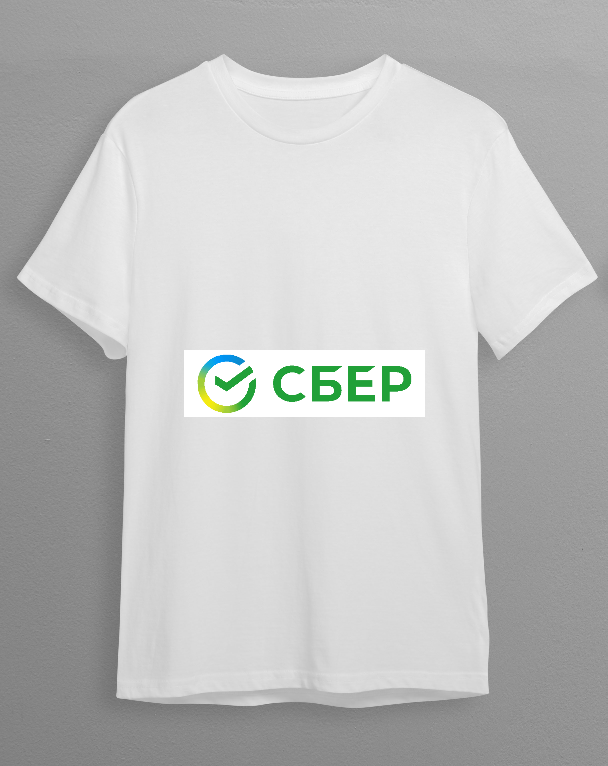

In [ ]:
import cv2
s_img = cv2.imread("/content/Sber_logo.png")
s_img = cv2.resize(s_img, (0,0), fx=0.33, fy=0.33)
l_img = cv2.imread("/content/tshirt.jpg")
l_img = cv2.resize(l_img, (0,0), fx=0.25, fy=0.25)
x_offset= l_img.shape[1] //2 - s_img.shape[1]//2
y_offset= l_img.shape[0] //2 - s_img.shape[0]//2
l_img[y_offset:y_offset+s_img.shape[0], x_offset:x_offset+s_img.shape[1]] = s_img
cv2_imshow(l_img)

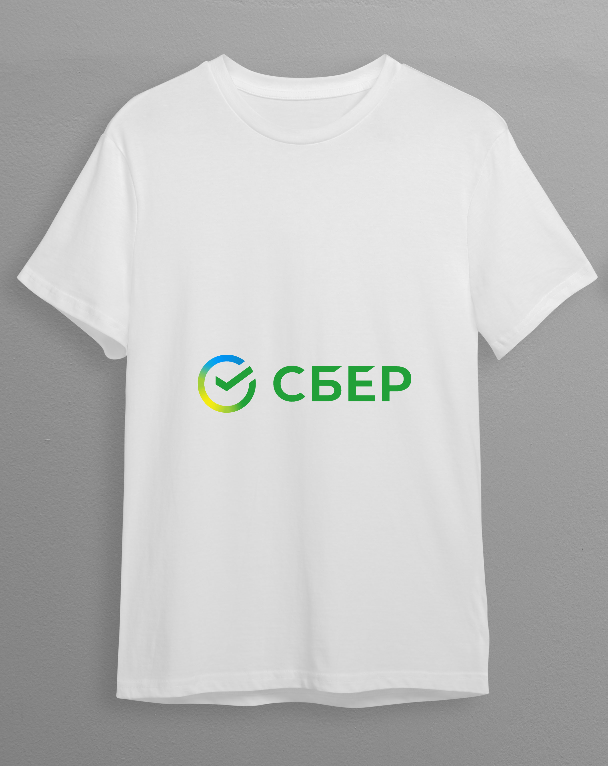

In [ ]:
s_img = cv2.imread("/content/Sber_logo.png", -1)
s_img = cv2.resize(s_img, (0,0), fx=0.33, fy=0.33)

l_img = cv2.imread("/content/tshirt.jpg")
l_img = cv2.resize(l_img, (0,0), fx=0.25, fy=0.25)

y1, y2 = y_offset, y_offset + s_img.shape[0]
x1, x2 = x_offset, x_offset + s_img.shape[1]

alpha_s = s_img[:, :, 3] / 255.0
alpha_l = 1.0 - alpha_s

for c in range(0, 3):
    l_img[y1:y2, x1:x2, c] = (alpha_s * s_img[:, :, c] +
                              alpha_l * l_img[y1:y2, x1:x2, c])

cv2_imshow(l_img)

In [ ]:
# def overlay_image_alpha(img, img_overlay, x, y, alpha_mask):
#     """Overlay `img_overlay` onto `img` at (x, y) and blend using `alpha_mask`.

#     `alpha_mask` must have same HxW as `img_overlay` and values in range [0, 1].
#     """
#     # Image ranges
#     y1, y2 = max(0, y), min(img.shape[0], y + img_overlay.shape[0])
#     x1, x2 = max(0, x), min(img.shape[1], x + img_overlay.shape[1])

#     # Overlay ranges
#     y1o, y2o = max(0, -y), min(img_overlay.shape[0], img.shape[0] - y)
#     x1o, x2o = max(0, -x), min(img_overlay.shape[1], img.shape[1] - x)

#     # Exit if nothing to do
#     if y1 >= y2 or x1 >= x2 or y1o >= y2o or x1o >= x2o:
#         return

#     # Blend overlay within the determined ranges
#     img_crop = img[y1:y2, x1:x2]
#     img_overlay_crop = img_overlay[y1o:y2o, x1o:x2o]
#     alpha = alpha_mask[y1o:y2o, x1o:x2o, np.newaxis]
#     alpha_inv = 1.0 - alpha

#     img_crop[:] = alpha * img_overlay_crop + alpha_inv * img_crop

  
# import numpy as np
# from PIL import Image

# # Prepare inputs
# x, y = 50, 0
# img = np.array(Image.open("img_large.jpg"))
# img_overlay_rgba = np.array(Image.open("img_small.png"))

# # Perform blending
# alpha_mask = img_overlay_rgba[:, :, 3] / 255.0
# img_result = img[:, :, :3].copy()
# img_overlay = img_overlay_rgba[:, :, :3]
# overlay_image_alpha(img_result, img_overlay, x, y, alpha_mask)

# # Save result
# Image.fromarray(img_result).save("img_result.jpg")

In [ ]:
# replace color

# Load the aerial image and convert to HSV colourspace
image = cv2.imread('/content/tshirt.jpg')
hsv=cv2.cvtColor(image,cv2.COLOR_BGR2HSV)

# Define lower and uppper limits of what we call "brown"
brown_lo=np.array([0,0,220])
brown_hi=np.array([179,5,255])

# Mask image to only select browns
mask=cv2.inRange(hsv,brown_lo,brown_hi)
# mask = cv2.bitwise_not(mask)

# Change image to red where we found brown

image[mask>0]=(238,155,110)

source_img = cv2.imread('/content/tshirt.jpg')
final_image = cv2.addWeighted(source_img, 0.75, image, 0.5, 0.0)
cv2_imshow(final_image)

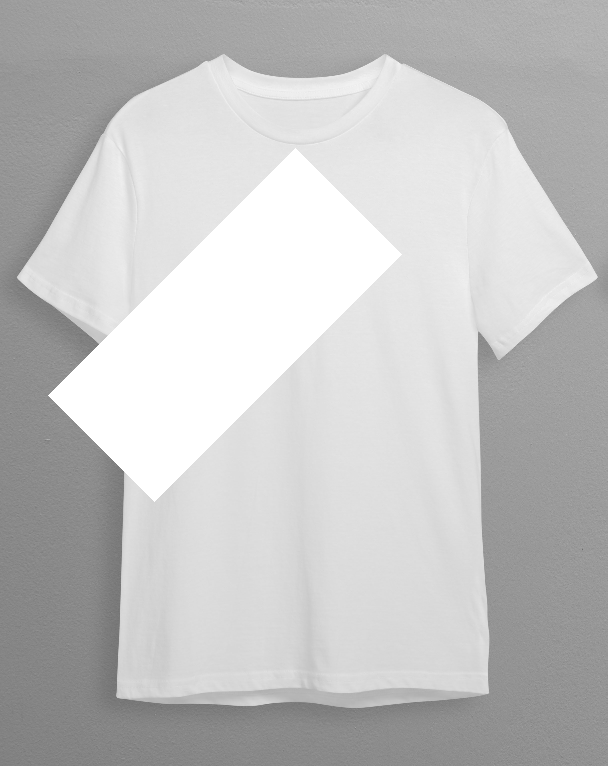

In [ ]:
image = cv2.imread('/content/tshirt.jpg')
image = cv2.resize(image, (0,0), fx=0.25, fy=0.25)

rotated_rectangle(image, (150, 150), (300, 500), (255,255,255), 1, 45)
cv2_imshow(image)

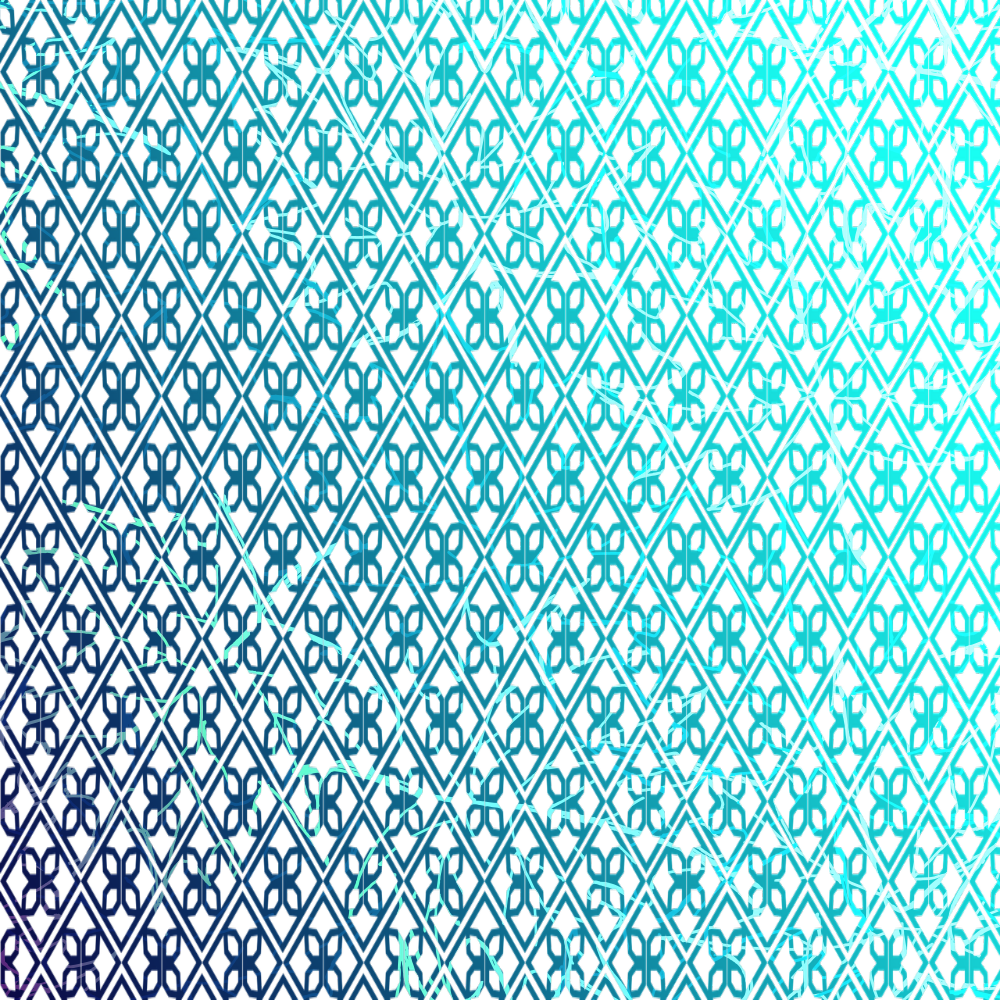

In [ ]:
import cv2  # import OpenCV
import numpy
from blend_modes import dodge # https://pythonhosted.org/blend_modes/

# Import background image
background_img_float = cv2.imread('/content/pngwing.com.png',-1).astype(float)
background_img_float = cv2.resize(background_img_float, (1000, 1000))

# Import foreground image
foreground_img_float = cv2.imread('/content/6-leaf-pattern-1-1.png',-1).astype(float)

# Blend images
opacity = 0.99  # The opacity of the foreground that is blended onto the background is 70 %.
blended_img_float = dodge(background_img_float, foreground_img_float, opacity)

cv2_imshow(blended_img_float)

## From countour

https://stackoverflow.com/questions/27299405/get-area-within-contours-opencv-python

In [ ]:
image1 = cv2.imread('/content/211022-earl-west-sneakerhead-mn-1550-8152ef.jpg')
image2 = cv2.imread('/content/is-it-too-hard-to-buy-sneakers-dropcast-feat.jpg')
image = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 45, 0)

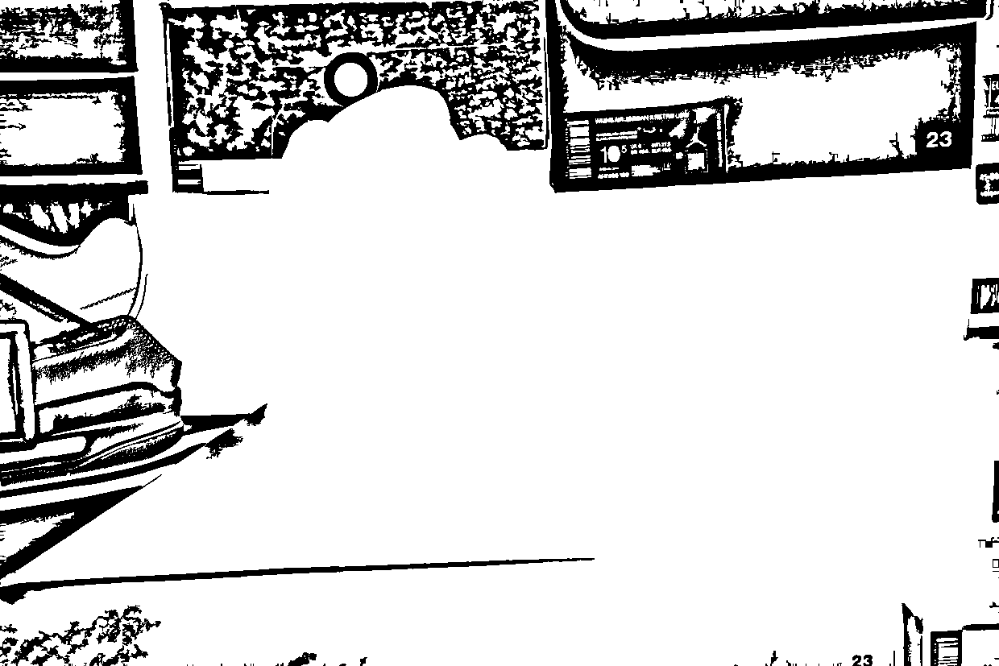

In [ ]:
cnt = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)[0]

mask = np.zeros(image.shape[:2], np.uint8)
contour = cv2.drawContours(mask, cnt, -1, 255, -1)
cv2_imshow(contour)

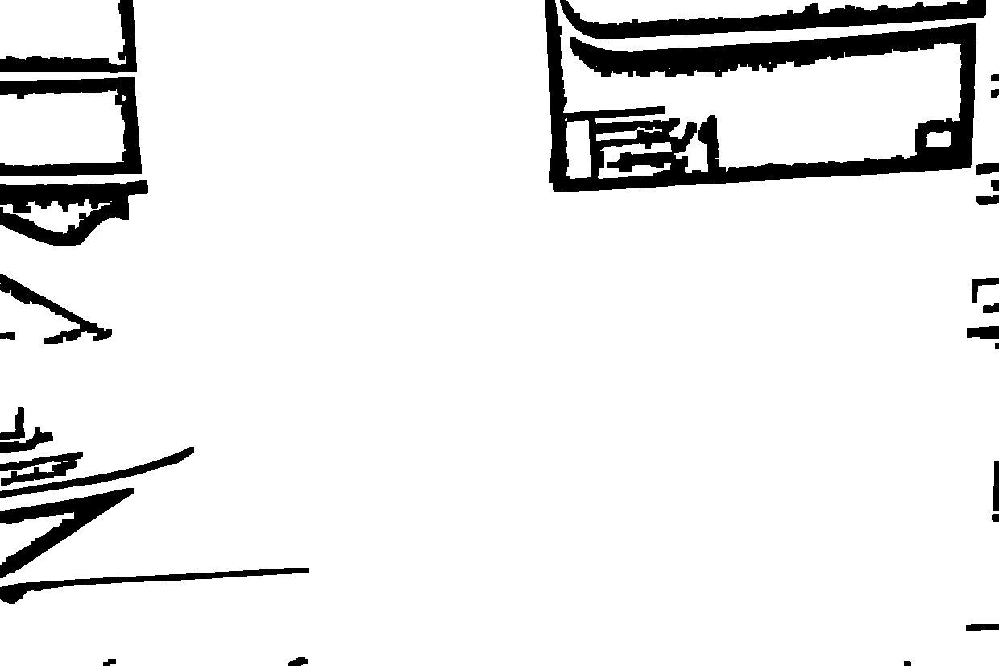

In [ ]:
import numpy as np
import cv2 
# image = cv2.imread('...') # Load your image in here
image = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
# Your code to threshold
image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 45, 0)    

# Perform morphology
se = np.ones((7,7), dtype='uint8')
image_close = cv2.morphologyEx(image, cv2.MORPH_CLOSE, se)

# Your code now applied to the closed image
cnt = cv2.findContours(image_close, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)[0]
mask = np.zeros(image.shape[:2], np.uint8)
cv2.drawContours(mask, cnt, -1, 255, -1)

cv2_imshow(cv2.drawContours(mask, cnt, -1, 255, -1))

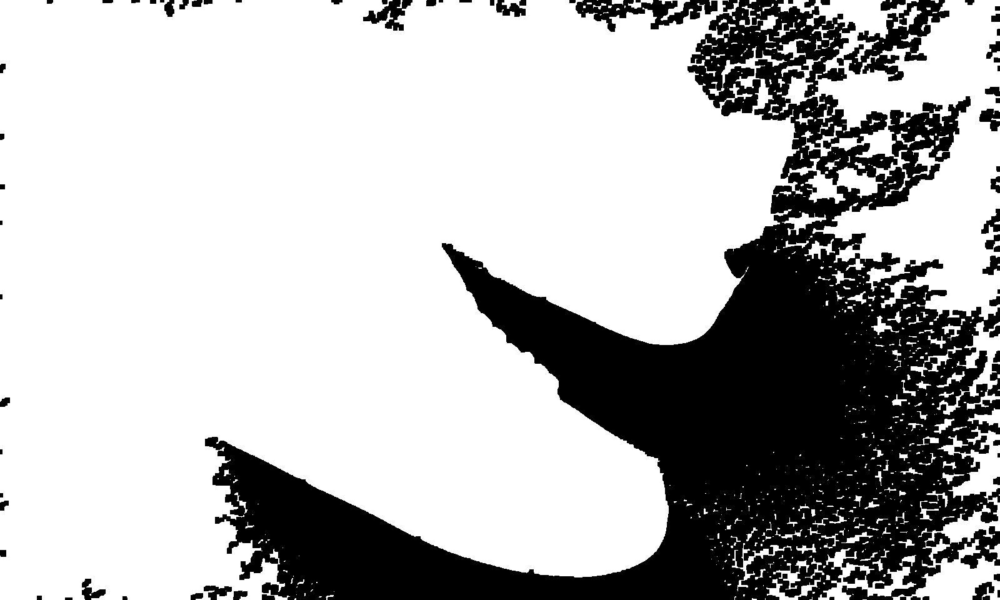

In [ ]:
import cv2

# Load in image, convert to grayscale, and threshold
image = image2
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# Close contour
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

# Find outer contour and fill with white
cnts = cv2.findContours(close, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cv2.fillPoly(close, cnts, [255,255,255])

cv2_imshow(close)

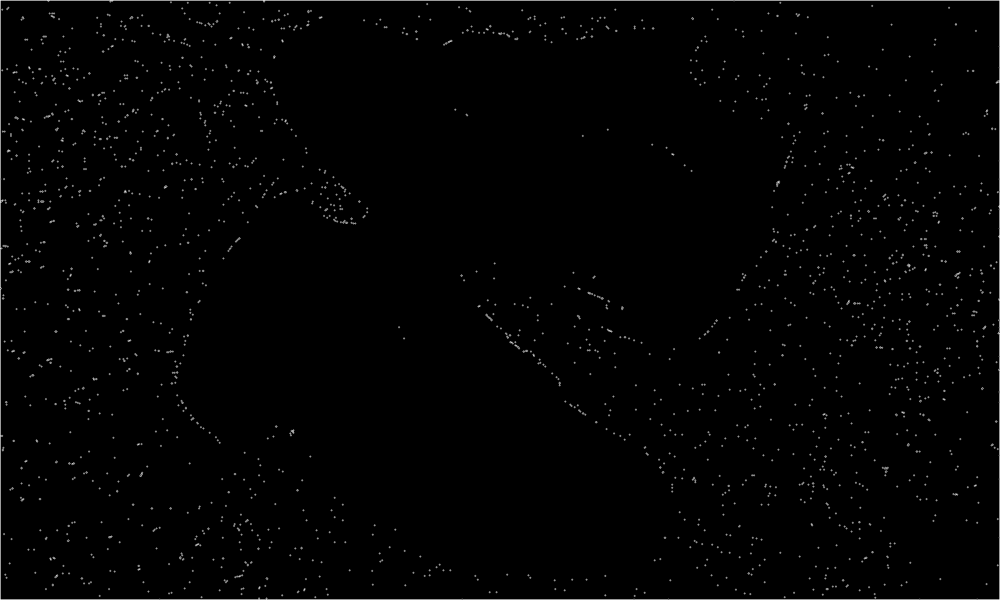

In [ ]:
image = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
contours, _ = cv2.findContours(image.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
mask = np.zeros(image.shape, np.uint8)

# cv2_imshow(cv2.drawContours(mask, contours, -1, (255),1))
cv2.drawContours(mask, contours, -1, (255,255,255),1)
cv2_imshow(mask)

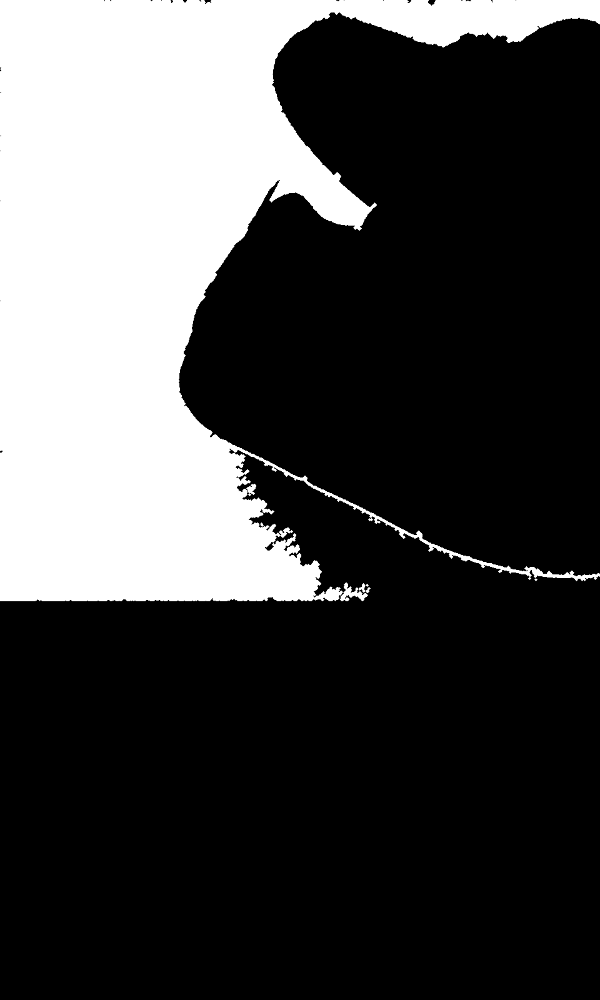

In [ ]:
img = cv2.imread('/content/is-it-too-hard-to-buy-sneakers-dropcast-feat.jpg')
image_contours = np.zeros((img.shape[1],
                           img.shape[0], 1),
                          np.uint8)

image_binary = np.zeros((img.shape[1],
                         img.shape[0], 1),
                        np.uint8)

for channel in range(img.shape[2]):
    ret, image_thresh = cv2.threshold(img[:, :, channel],
                                     38, 255,
                                     cv2.THRESH_BINARY)

    contours = cv2.findContours(image_thresh, 1, 1)[0]   
    cv2.drawContours(image_contours,
                    contours, -1,
                    (255,255,255), 3)

contours = cv2.findContours(image_contours, cv2.RETR_LIST,
                           cv2.CHAIN_APPROX_SIMPLE)[0]

cv2.drawContours(image_binary, [max(contours, key = cv2.contourArea)],
                -1, (255, 255, 255), -1)

cv2.imwrite('LPR.jpg', image_binary)
cv2_imshow(image_binary)

/usr/local/lib/python3.7/dist-packages/scipy/interpolate/_fitpack_impl.py:226: RuntimeWarning: Setting x[0][19052]=x[0][0]
  (i, m, i)))


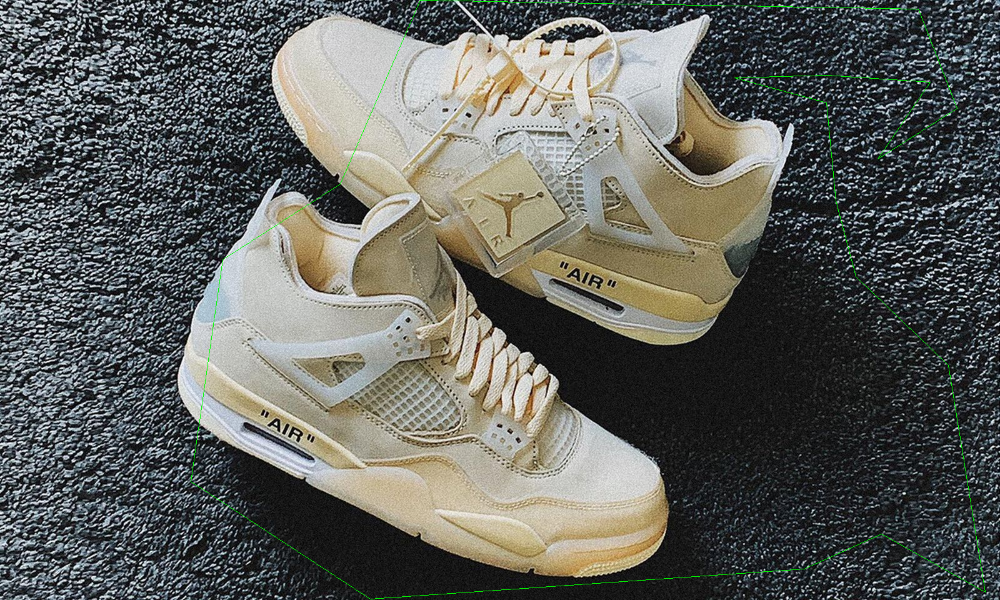

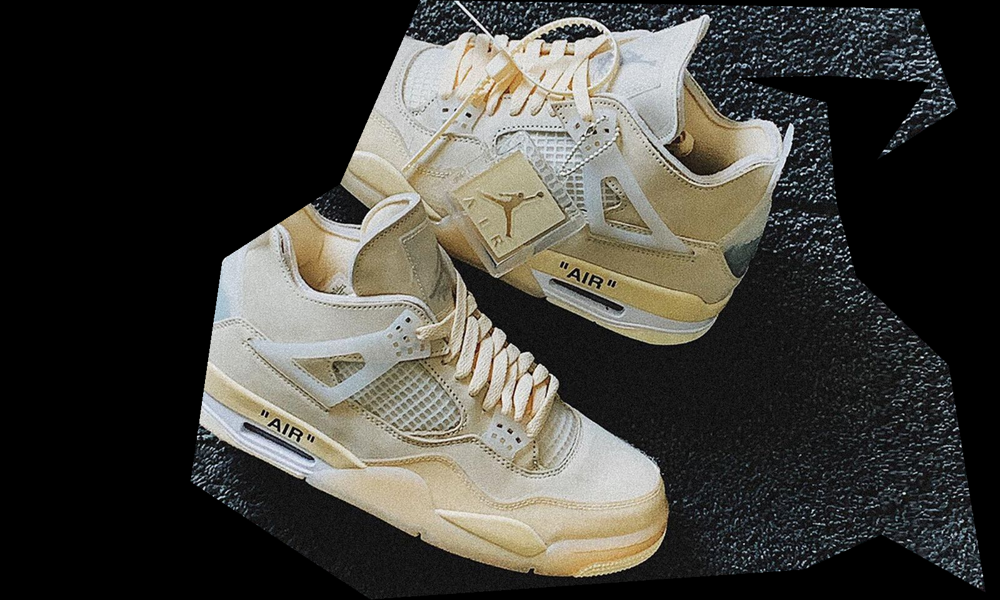

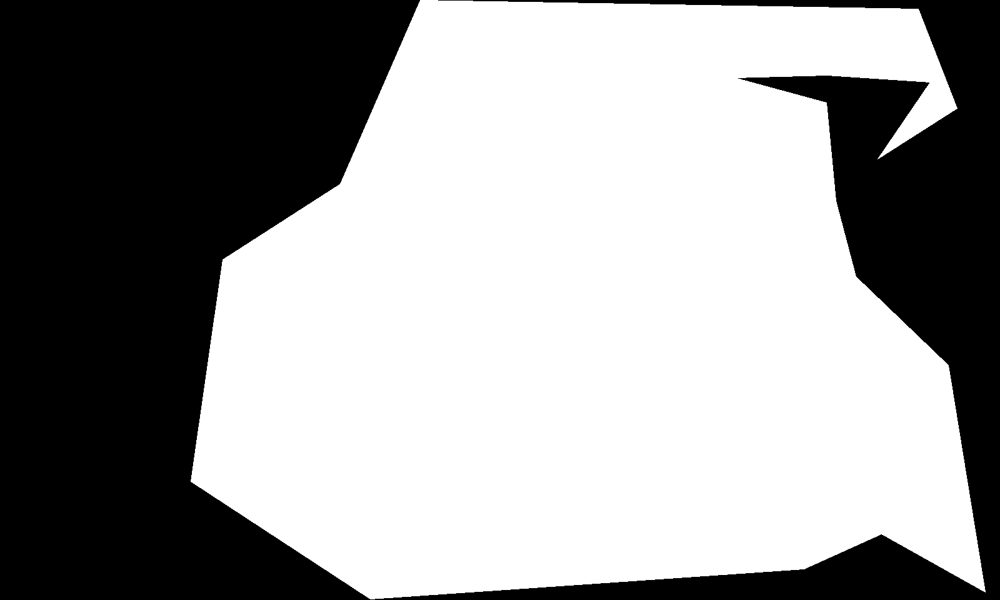

In [ ]:
import numpy as np
import cv2
from scipy.interpolate import splprep, splev

orig_im = cv2.imread("/content/is-it-too-hard-to-buy-sneakers-dropcast-feat.jpg")

im = orig_im.copy()

h, w = im.shape[0], im.shape[1]

# Seed points for floodFill (use two points at each corner for improving robustness)
seedPoints = ((0, 0), (10, 10), (w-1, 0), (w-1, 10), (0, h-1), (10, h-1), (w-1, h-1), (w-10, h-10))

# Fill background with black color
for seed in seedPoints:
    cv2.floodFill(im, None, seedPoint=seed, newVal=(0, 0, 0), loDiff=(5, 5, 5), upDiff=(5, 5, 5))

# Use "close" morphological operation
im = cv2.morphologyEx(im, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10)));

#Convert to Grayscale, and then to binary image.
gray = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
ret, thresh_gray = cv2.threshold(gray, 5, 255, cv2.THRESH_BINARY)

#Find contours
contours, _ = cv2.findContours(thresh_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
c = max(contours, key=cv2.contourArea) # Get the largest contour

# Smooth contour
# https://agniva.me/scipy/2016/10/25/contour-smoothing.html
x,y = c.T
x = x.tolist()[0]
y = y.tolist()[0]
tck, u = splprep([x,y], u=None, s=1.0, per=1)
u_new = np.linspace(u.min(), u.max(), 20)
x_new, y_new = splev(u_new, tck, der=0)
res_array = [[[int(i[0]), int(i[1])]] for i in zip(x_new,y_new)]
smoothened = np.asarray(res_array, dtype=np.int32)

# For testing
test_im = orig_im.copy()
cv2.drawContours(test_im, [smoothened], 0, (0, 255, 0), 1)

# Build a mask
mask = np.zeros_like(thresh_gray)
cv2.drawContours(mask, [smoothened], -1, 255, -1)

# Apply mask
res = np.zeros_like(orig_im)
res[(mask > 0)] = orig_im[(mask > 0)]

# Show images for testing
cv2_imshow(test_im)
cv2_imshow(res)
cv2_imshow( mask)